In [1]:
# import packages
import os
import lap
import copy
import torch
from torch import optim
from torch.utils.data import DataLoader
import numpy as np
from scipy.stats import norm
from scipy.stats import pearsonr
from scipy.spatial.distance import cdist
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

os.chdir("..")
from data.dataset import ConditionalDataset
from data.utils import to_one_hot, load_sz_score, load_sfnc
from models.ivae import iVAE
from models.vae import VAE
from models.ppca import PPCA
from models.utils import EarlyStopper

In [2]:
# define parameters
method = 'vae'
seed = 3
n_layer = 3
hidden_dim = [128, 64, 32]
latent_dim = 2
batch_size = 16
learning_rate = 0.001
n_epoch = 1000
mode = 'test'
cuda = False
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

res_path = f'/data/users4/xli/interpolation/results/sfnc_sz/{method}/test'
os.mkdir(res_path) if not os.path.exists(res_path) else None

ckpt_file = os.path.join(res_path, f'{method}_layer{n_layer}_dim{hidden_dim[0]}_bs{batch_size}_lr{learning_rate}_seed{seed}.pt')

# load datasets
data_path = '/data/users2/zfu/Matlab/GSU/Neuromark/Results'

# load demographic information
fbirn_sub_path = os.path.join(data_path, 'Subject_selection', 'FBIRN', 'sub_info_FBIRN.mat')
fbirn_sub_data, invalid_sub_ind = load_sz_score(fbirn_sub_path)

# load sFNC
fbirn_sfnc_path = os.path.join(data_path, 'SFNC', 'FBIRN', 'FBIRN.mat')
fbirn_sfnc_data, fbirn_sfnc_data_raw = load_sfnc(fbirn_sfnc_path, invalid_sub_ind)
fbirn_sfnc_data_mean_removed = fbirn_sfnc_data_raw - np.mean(fbirn_sfnc_data_raw, axis=0)

# concatenate patients and controls
n_sub = fbirn_sub_data.shape[0]
ind_pt = np.where(fbirn_sub_data[:, 0]==1)[0][:n_sub//2] # 125 SZ
ind_hc = np.where(fbirn_sub_data[:, 0]==2)[0][:(n_sub-ind_pt.shape[0])] # 141 HC
print(f"N patient = {ind_pt.shape[0]}; N control = {ind_hc.shape[0]}")

sfnc_data = np.concatenate((fbirn_sfnc_data[ind_pt, :], fbirn_sfnc_data[ind_hc, :]), axis=0)
sfnc_data_raw = np.concatenate((fbirn_sfnc_data_raw[ind_pt, :], fbirn_sfnc_data_raw[ind_hc, :]), axis=0)
sfnc_data_mean_removed = sfnc_data_raw - np.mean(sfnc_data_raw, axis=0)
sub_data = np.concatenate((fbirn_sub_data[ind_pt, :], fbirn_sub_data[ind_hc, :]), axis=0)

# split data into training and test sets
n_test = 41
n_train = n_sub - n_test
ind_pt_test = ind_pt[:n_test//2]
ind_pt_train = ind_pt[n_test//2:]
ind_hc_test = ind_hc[:n_test-n_test//2]
ind_hc_train = ind_hc[n_test-n_test//2:]
print(f"N patient test = {ind_pt_test.shape[0]}; N control test = {ind_hc_test.shape[0]}; N patient train = {ind_pt_train.shape[0]}; N control train = {ind_hc_train.shape[0]}")

sfnc_data_test = np.concatenate((fbirn_sfnc_data[ind_pt_test, :], fbirn_sfnc_data[ind_hc_test, :]), axis=0)
sfnc_data_raw_test = np.concatenate((fbirn_sfnc_data_raw[ind_pt_test, :], fbirn_sfnc_data_raw[ind_hc_test, :]), axis=0)
sfnc_data_mean_removed_test = sfnc_data_raw_test - np.mean(sfnc_data_raw_test, axis=0)
sub_data_test = np.concatenate((fbirn_sub_data[ind_pt_test, :], fbirn_sub_data[ind_hc_test, :]), axis=0)

y_test = to_one_hot(sub_data_test[:,0])[0][:,1:]

sfnc_data_train = np.concatenate((fbirn_sfnc_data[ind_pt_train, :], fbirn_sfnc_data[ind_hc_train, :]), axis=0)
sfnc_data_raw_train = np.concatenate((fbirn_sfnc_data_raw[ind_pt_train, :], fbirn_sfnc_data_raw[ind_hc_train, :]), axis=0)
sfnc_data_mean_removed_train = sfnc_data_raw_train - np.mean(sfnc_data_raw_train, axis=0)
sub_data_train = np.concatenate((fbirn_sub_data[ind_pt_train, :], fbirn_sub_data[ind_hc_train, :]), axis=0)

y_train = to_one_hot(sub_data_train[:,0])[0][:,1:]

data_dim = sfnc_data_train.shape[1]
aux_dim = y_train.shape[1]

# create data loaders
loader_params = {'num_workers': 1, 'pin_memory': True} if cuda else {}

ds_train = ConditionalDataset(sfnc_data_train.astype(np.float32), y_train.astype(np.float32), device)
data_loader_train = DataLoader(ds_train, shuffle=False, batch_size=batch_size, **loader_params)

ds_test = ConditionalDataset(sfnc_data_test.astype(np.float32), y_test.astype(np.float32), device)
data_loader_test = DataLoader(ds_test, shuffle=False, batch_size=batch_size, **loader_params)

N patient = 125; N control = 141
N patient test = 20; N control test = 21; N patient train = 105; N control train = 120


In [3]:
n_pt_male = len(np.where(fbirn_sub_data[ind_pt, -1]==1)[0])
n_hc_male = len(np.where(fbirn_sub_data[ind_hc, -1]==1)[0])
n_pt_female = len(np.where(fbirn_sub_data[ind_pt, -1]==2)[0])
n_hc_female = len(np.where(fbirn_sub_data[ind_hc, -1]==2)[0])
n_pt_age = fbirn_sub_data[ind_pt, -2]
n_hc_age = fbirn_sub_data[ind_hc, -2]

print(f"patient N male = {n_pt_male}, N female = {n_pt_female}; age mean = {np.mean(n_pt_age):.2f} std = {np.std(n_pt_age):.2f} min = {np.min(n_pt_age)} max = {np.max(n_pt_age)}")
print(f"control N male = {n_hc_male}, N female = {n_hc_female}; age mean = {np.mean(n_hc_age):.2f} std = {np.std(n_hc_age):.2f} min = {np.min(n_hc_age)} max = {np.max(n_hc_age)}")

patient N male = 95, N female = 30; age mean = 38.88 std = 11.19 min = 18.0 max = 62.0
control N male = 103, N female = 38; age mean = 37.15 std = 11.03 min = 19.0 max = 59.0


In [4]:
if method == 'vae':
    model = VAE(input_dim=data_dim, 
                latent_dim=latent_dim, 
                hidden_dims=hidden_dim, 
                seed=seed)
    print(model)

    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=10)
    early_stopper = EarlyStopper(patience=20, threshold=1e-2, min_delta=1e-3)

    # train model
    model.train()

    for it in range(n_epoch):
        loss_train = 0
        for _, (x, _) in enumerate(data_loader_train):
            x = x.view(x.size(0), -1).to(device)
            optimizer.zero_grad()
            x_rec, mean, logvar = model(x)
            loss = model.loss(x_rec, x, mean, logvar)
            loss.backward()
            optimizer.step()
            loss_train += loss.item()
        loss_train /= len(data_loader_train)
        scheduler.step(loss_train)
        print(f'Epoch: {it}; Loss: {loss_train:.5f}')
        if early_stopper.early_stop(loss_train):
            print(f'Early stopping triggered!')
            break

    # save model checkpoint after training
    torch.save(model.state_dict(), ckpt_file)
    
    x_train, u_train = ds_train.x, ds_train.y
    x_test, u_test = ds_test.x, ds_test.y
    _, z_train, _ = model(x_train)
    _, z_test, _ = model(x_test)
    z_train = z_train.detach().cpu().numpy()
    z_test = z_test.detach().cpu().numpy()

elif method == 'ivae':
    model = iVAE(data_dim=data_dim,
                 latent_dim=latent_dim,
                 aux_dim=aux_dim,
                 hidden_dim=hidden_dim,
                 n_layer=n_layer,
                 activation='xtanh',
                 device=device,
                 seed=seed)
    print(model)
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=10)
    early_stopper = EarlyStopper(patience=20, threshold=1e-2, min_delta=1e-3)

    # train model
    model.train()

    for it in range(n_epoch):
        loss_train = 0
        for _, (x, u) in enumerate(data_loader_train):
            optimizer.zero_grad()
            x, u = x.to(device), u.to(device)
            loss, z_est = model.loss(x, u)
            loss.mul(-1).backward()
            optimizer.step()
            loss_train += -loss.item()
        loss_train /= len(data_loader_train)
        scheduler.step(loss_train)
        print(f'Epoch: {it}; Loss: {loss_train:.3f}')
        if early_stopper.early_stop(loss_train):
            print(f'Early stopping triggered!')
            break

    # save model checkpoint after training
    torch.save(model.state_dict(), ckpt_file)

    x_train, u_train = ds_train.x, ds_train.y
    x_test, u_test = ds_test.x, ds_test.y
    _, _, z_train, _ = model(x_train, u_train)
    _, _, z_test, _ = model(x_test, u_test)
    z_train = z_train.detach().cpu().numpy()
    z_test = z_test.detach().cpu().numpy()

elif method == 'ppca':
    model = PPCA(latent_dim=latent_dim, max_iter=1000, seed=seed)
    model.fit(sfnc_data_train)
    z_train = model.transform(sfnc_data_train)
    z_test = model.transform(sfnc_data_test)

np.save(os.path.join(res_path, 'z_train.npy'), z_train)
np.save(os.path.join(res_path, 'z_test.npy'), z_test)

VAE(
  (encoder): Sequential(
    (0): Linear(in_features=1378, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.5)
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): LeakyReLU(negative_slope=0.5)
    (4): Linear(in_features=64, out_features=32, bias=True)
    (5): LeakyReLU(negative_slope=0.5)
  )
  (fc_mean): Linear(in_features=32, out_features=2, bias=True)
  (fc_logvar): Linear(in_features=32, out_features=2, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=32, bias=True)
    (1): LeakyReLU(negative_slope=0.5)
    (2): Linear(in_features=32, out_features=64, bias=True)
    (3): LeakyReLU(negative_slope=0.5)
    (4): Linear(in_features=64, out_features=128, bias=True)
    (5): LeakyReLU(negative_slope=0.5)
    (6): Linear(in_features=128, out_features=1378, bias=True)
  )
)
Epoch: 0; Loss: 1581.62962
Epoch: 1; Loss: 1033.60599
Epoch: 2; Loss: 936.83072
Epoch: 3; Loss: 863.96751
Epoch: 4; Loss: 821.95258
Epoch: 5; Loss

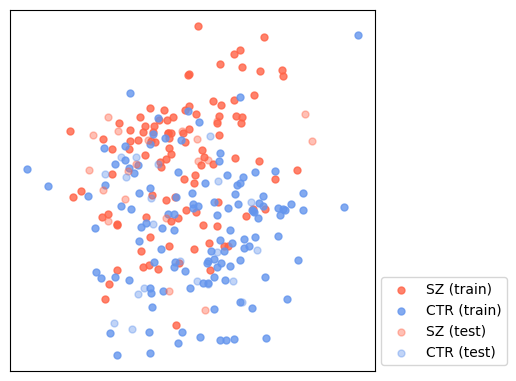

In [5]:
y_train_ind_sz = np.where(y_train[:,0]==1)[0] # patient
y_train_ind_hc = np.where(y_train[:,1]==1)[0] # control

y_test_ind_sz = np.where(y_test[:,0]==1)[0] # patient
y_test_ind_hc = np.where(y_test[:,1]==1)[0] # control

plt.figure(figsize=(5.5,4))
plt.xticks([], [])
plt.yticks([], [])
plt.scatter(z_train[y_train_ind_sz, 0], z_train[y_train_ind_sz, 1], marker='o', alpha=0.8, c='tomato', s=25, label='SZ (train)')
plt.scatter(z_train[y_train_ind_hc, 0], z_train[y_train_ind_hc, 1], marker='o', alpha=0.8, c='cornflowerblue', s=25, label='CTR (train)')
plt.scatter(z_test[y_test_ind_sz, 0], z_test[y_test_ind_sz, 1], marker='o', alpha=0.4, c='tomato', s=25, label='SZ (test)')
plt.scatter(z_test[y_test_ind_hc, 0], z_test[y_test_ind_hc, 1], marker='o', alpha=0.4, c='cornflowerblue', s=25, label='CTR (test)')
plt.legend(bbox_to_anchor=(1.38, 0.28))
plt.tight_layout()
plt.savefig(os.path.join(res_path, f'{method}_latent_space.png'), dpi=500)

In [6]:
n_train_sq = np.sqrt(n_train).astype(np.int64)
xv, yv = np.meshgrid(np.linspace(0, 1, n_train_sq), np.linspace(0, 1, n_train_sq))
grid = np.dstack((xv, yv)).reshape(-1, 2)
cost = cdist(grid, z_train, 'sqeuclidean')
min_cost, row_assigns, col_assigns = lap.lapjv(np.copy(cost), extend_cost=True)
grid_jv = grid[col_assigns]
np.save(os.path.join(res_path, 'grid_jv.npy'), grid_jv)

grid_jv_int = grid_jv * (n_train_sq-1)

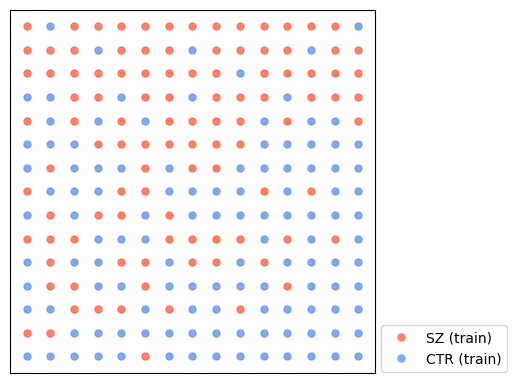

In [7]:
plt.figure(figsize=(5.5,4))
y_train_2d = np.zeros((n_train_sq, n_train_sq))

for i in range(n_train):
  if (y_train[i,0] == 1):
    plt.scatter(grid_jv[i,0], grid_jv[i,1], marker='o', alpha=0.8, c='tomato', s=25)
    y_train_2d[n_train_sq-1 - np.round(grid_jv_int[i,1]).astype(int), np.round(grid_jv_int[i,0]).astype(int)] = 1
  else:
    plt.scatter(grid_jv[i,0], grid_jv[i,1], marker='o', alpha=0.8, c='cornflowerblue', s=25)
    y_train_2d[n_train_sq-1 - np.round(grid_jv_int[i,1]).astype(int), np.round(grid_jv_int[i,0]).astype(int)] = 2

np.save(os.path.join(res_path,'y_train_2d.npy'), y_train_2d)

legend_elements = [Line2D([0], [0], marker='o', alpha=0.8, color='w', label='SZ (train)',
                          markerfacecolor='tomato', markersize=7),
                   Line2D([0], [0], marker='o', alpha=0.8, color='w', label='CTR (train)',
                          markerfacecolor='cornflowerblue', markersize=7)]

plt.xticks([], [])
plt.yticks([], [])
plt.legend(handles=legend_elements, loc='best', bbox_to_anchor=(1.38, 0.15))
plt.tight_layout()
plt.savefig(os.path.join(res_path, f'{method}_latent_space_lap.png'), dpi=500)

In [8]:
n_test_sq = np.sqrt(n_test).astype(np.int64)
cost = cdist(grid, z_test, 'sqeuclidean')
min_cost, row_assigns, col_assigns = lap.lapjv(np.copy(cost), extend_cost=True)
grid_jv_test = grid[col_assigns]
np.save(os.path.join(res_path, 'grid_jv_test.npy'), grid_jv_test)

grid_jv_int_test = grid_jv_test * (n_train_sq-1)

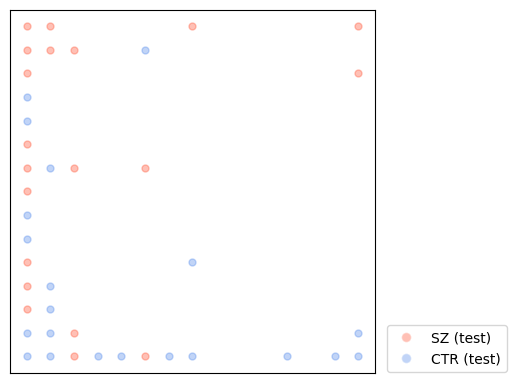

In [9]:
plt.figure(figsize=(5.5,4))
y_test_2d = np.zeros( (n_train_sq, n_train_sq) )

for i in range(n_test):
  if (y_test[i,0] == 1):
    plt.scatter(grid_jv_test[i,0], grid_jv_test[i,1], marker='o', alpha=0.4, c='tomato', s=25)
    y_test_2d[ n_train_sq-1 - np.round(grid_jv_int_test[i,1]).astype(int), np.round(grid_jv_int_test[i,0]).astype(int) ] = 1
  else:
    plt.scatter(grid_jv_test[i,0], grid_jv_test[i,1], marker='o', alpha=0.4, c='cornflowerblue', s=25)
    y_test_2d[ n_train_sq-1 - np.round(grid_jv_int_test[i,1]).astype(int), np.round(grid_jv_int_test[i,0]).astype(int) ] = 2

np.save(os.path.join(res_path, 'y_test_2d.npy'), y_test_2d)

legend_elements = [Line2D([0], [0], marker='o', alpha=0.4, color='w', label='SZ (test)',
                          markerfacecolor='tomato', markersize=7),
                   Line2D([0], [0], marker='o', alpha=0.4, color='w', label='CTR (test)',
                          markerfacecolor='cornflowerblue', markersize=7)]

plt.xticks([], [])
plt.yticks([], [])
plt.legend(handles=legend_elements, loc='best', bbox_to_anchor=(1.38, 0.15))
plt.tight_layout()
plt.savefig(os.path.join(res_path, f'{method}_latent_space_lap_test.png'), dpi=500)

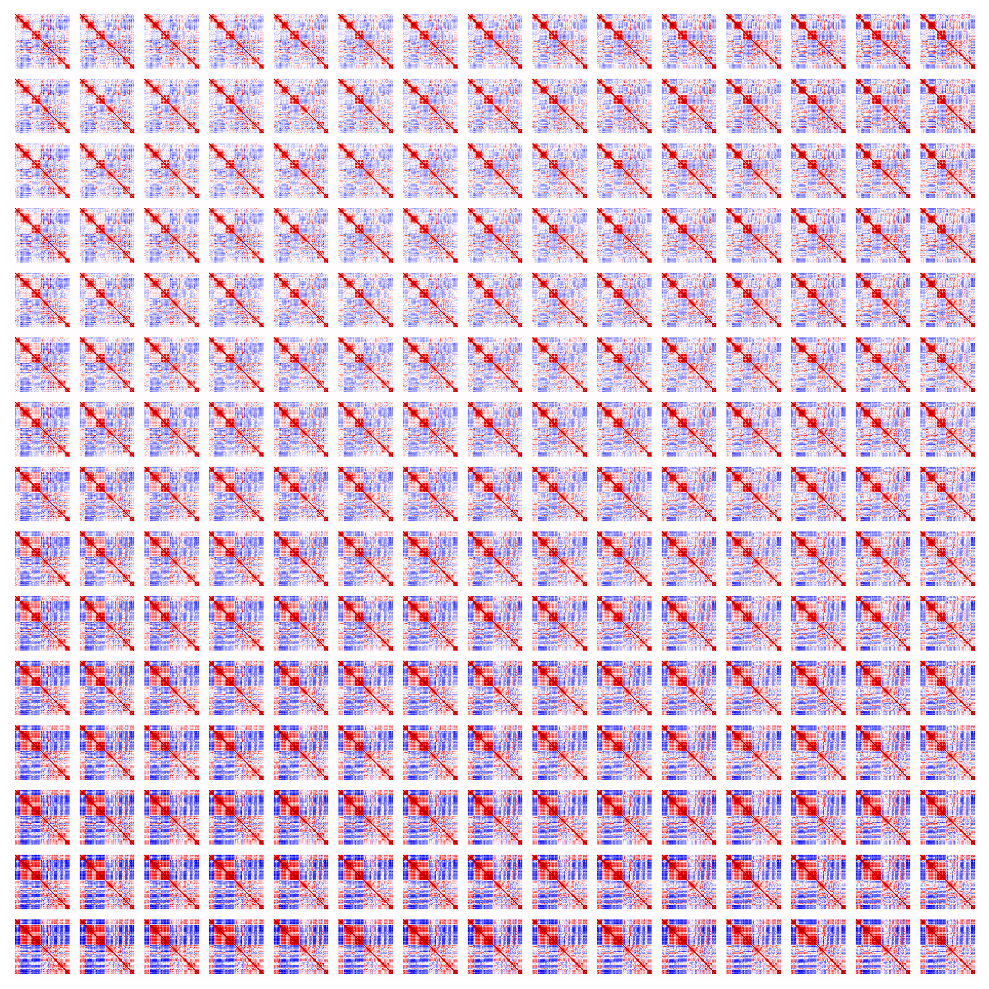

In [10]:
# display a 2D manifold of generated sFNC
figsize = 10
space = 10
matrix_size = 53

# linearly spaced coordinates in the latent space
scale = np.percentile(np.abs(z_train), 80) # take 80% percentile of the absolute value of z to avoid outliers
grid_x = np.linspace(-scale, scale, n_train_sq)
grid_y = np.linspace(-scale, scale, n_train_sq)[::-1]

fnc_vae = np.zeros(((matrix_size+space) * n_train_sq, (matrix_size+space) * n_train_sq))
for i, yi in enumerate(grid_y):
  for j, xi in enumerate(grid_x):
      z_sample = torch.Tensor([[xi, yi]])
      if method in ['vae', 'ivae']:
        x_reconstructed = np.squeeze(model.decode(z_sample).detach().numpy())
      elif method == 'ppca':
        x_reconstructed = model.inverse_transform(z_sample.numpy())
      sfnc = np.zeros((matrix_size, matrix_size))
      sfnc[np.triu_indices(matrix_size, 1)] = x_reconstructed
      sfnc[np.tril_indices(matrix_size, -1)] = sfnc.T[np.tril_indices(53, -1)]
      sfnc[np.diag_indices(matrix_size)] = 1

      fnc_vae[
          i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+53,
          j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+53,
      ] = sfnc

np.save(os.path.join(res_path, f'fnc_{method}.npy'), fnc_vae)

plt.figure(figsize=(figsize, figsize))
colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_vae, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}.png'), dpi=500)

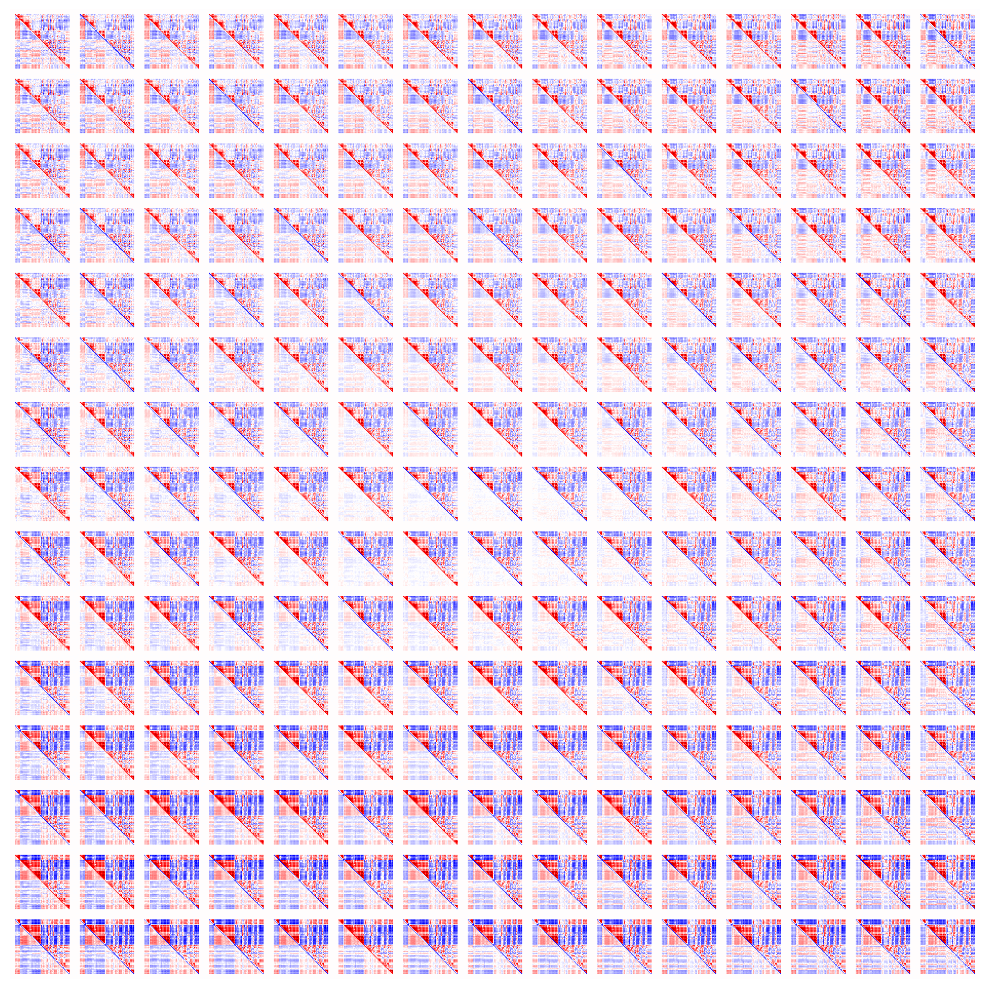

In [11]:
# display a 2D manifold of generated sFNC with mean removed
fnc_vae_list = []
fnc_vae_mean_removed = copy.copy(fnc_vae)
fnc_vae_mean_rm = np.zeros(fnc_vae_mean_removed.shape)

for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        fnc_vae_list.append(fnc_vae[
            i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
            j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
        ])

fnc_vae_mean = np.mean(np.array(fnc_vae_list), axis=0)
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        sfnc = copy.copy(fnc_vae_mean_removed[
            i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
            j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
        ])
        sfnc[np.tril_indices(matrix_size, -1)] = sfnc[np.tril_indices(matrix_size, -1)] - fnc_vae_mean[np.tril_indices(matrix_size, -1)]
        if y_train_2d[i, j] == 1:
          sfnc[ np.diag_indices(53) ] = 0.5
        else:
          sfnc[ np.diag_indices(53) ] = -0.5

        fnc_vae_mean_rm[
            i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
            j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
        ] = sfnc
np.save(os.path.join(res_path, f'fnc_{method}_mean_rm.npy'), fnc_vae_mean_rm)

plt.figure(figsize=(figsize, figsize))

colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_vae_mean_rm, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}_diag_mean_removed.pdf'))

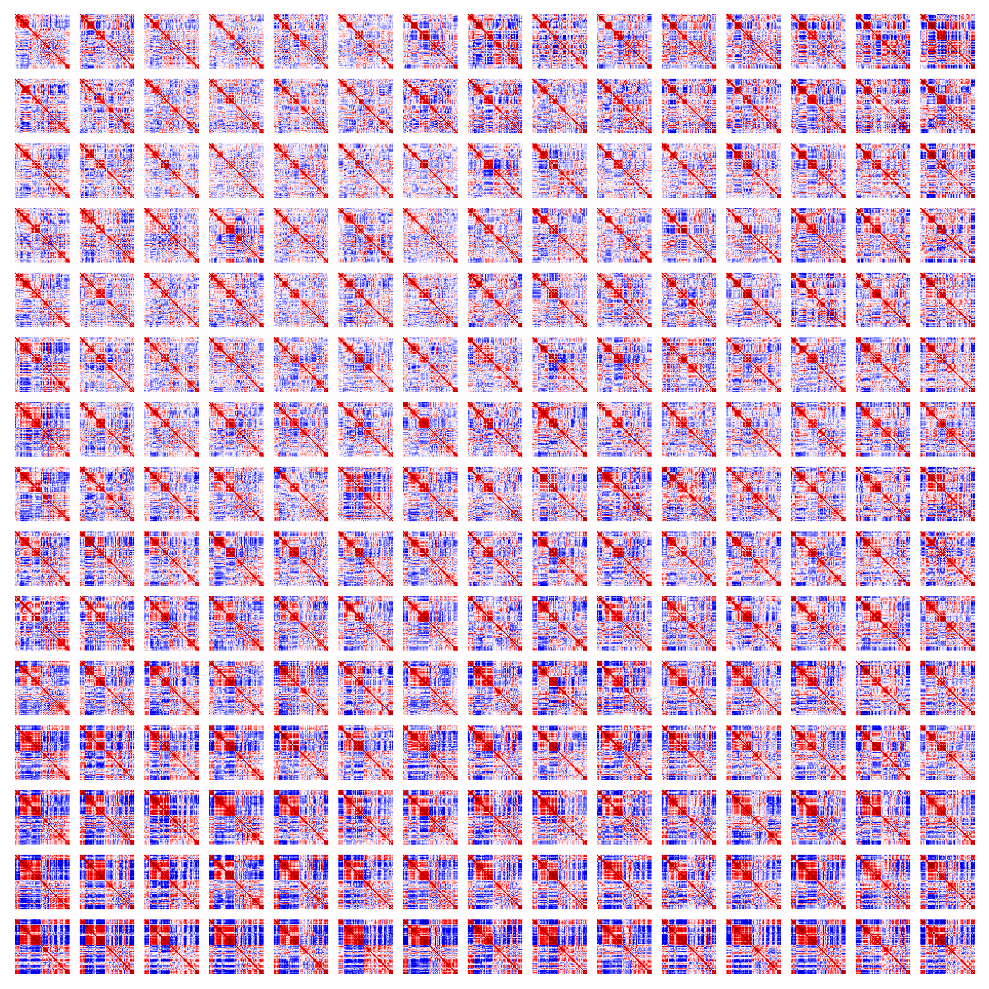

In [12]:
# display a 2D manifold of original sFNC
fnc_orig = np.zeros(( (matrix_size+space) * n_train_sq, (matrix_size+space) * n_train_sq))
for sub in range(grid_jv_int.shape[0]):
    i = (n_train_sq-1) - round(grid_jv_int[sub, 1])
    j = round(grid_jv_int[sub, 0])
    fnc_orig[
        i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
        j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
    ] = sfnc_data_raw_train[sub]
np.save(os.path.join(res_path, 'fnc_orig.npy'), fnc_orig)

plt.figure(figsize=(figsize, figsize))

colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_orig, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig.png'), dpi=500)

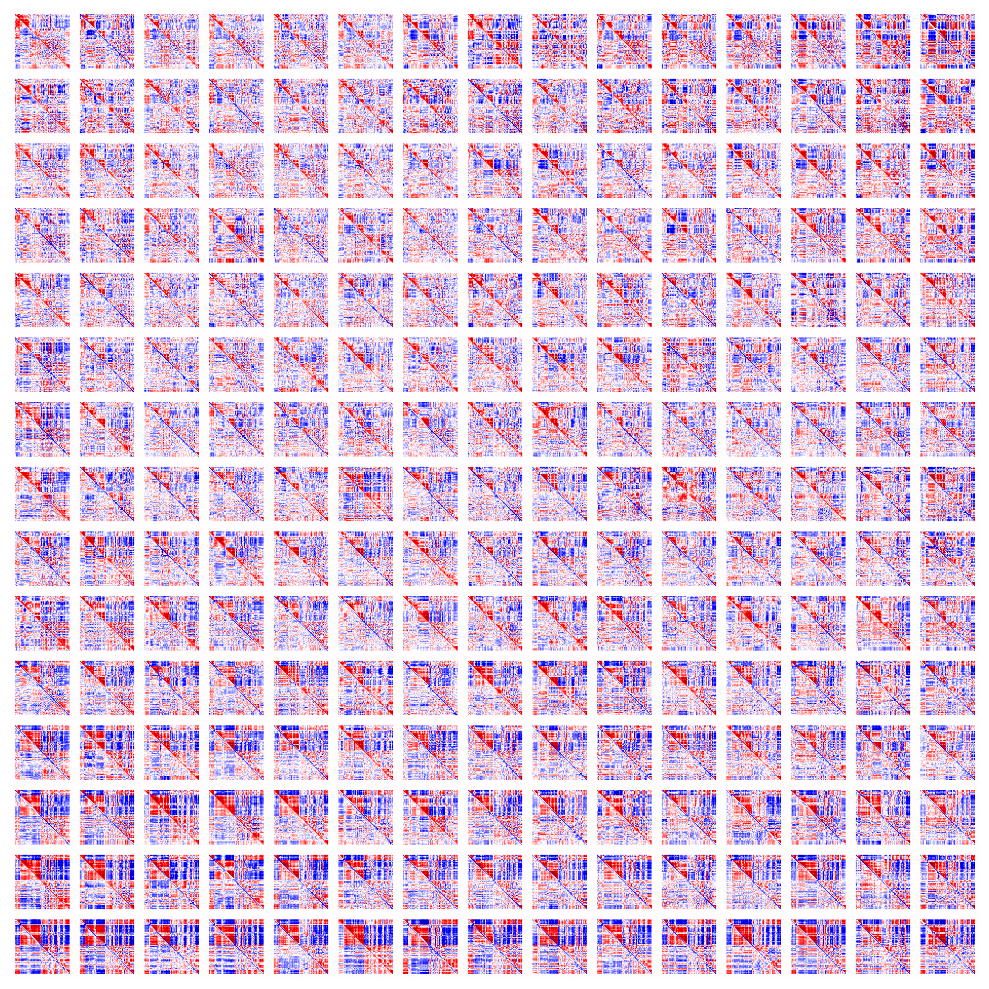

In [13]:
# display a 2D manifold of original sFNC with mean removed
fnc_orig_mean_rm = np.zeros(( (matrix_size+space) * n_train_sq, (matrix_size+space) * n_train_sq))
for sub in range(grid_jv_int.shape[0]):
  sfnc = copy.copy(sfnc_data_raw_train[sub])
  sfnc_mean_removed = copy.copy(sfnc_data_mean_removed_train[sub])
  if (y_train[sub,0] == 1):
    sfnc[ np.diag_indices(matrix_size) ] = 0.5
  else:
    sfnc[ np.diag_indices(matrix_size) ] = -0.5
  sfnc[np.tril_indices(matrix_size, -1)] = sfnc_mean_removed[np.tril_indices(matrix_size, -1)]

  i = (n_train_sq-1) - round(grid_jv_int[sub, 1])
  j = round(grid_jv_int[sub, 0])
  fnc_orig_mean_rm[
      i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
      j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
  ] = sfnc
np.save(os.path.join(res_path, 'fnc_orig_mean_rm.npy'), fnc_orig_mean_rm)

plt.figure(figsize=(figsize, figsize))

colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_orig_mean_rm, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_diag_mean_removed.png'), dpi=500)

In [14]:
fnc_vae_hc_list = []
fnc_vae_pt_list = []
fnc_vae_mean_rm_hc_list = []
fnc_vae_mean_rm_pt_list = []
fnc_vae_hc_test_list = []
fnc_vae_pt_test_list = []
fnc_vae_mean_rm_hc_test_list = []
fnc_vae_mean_rm_pt_test_list = []

for i, yi in enumerate(grid_y):
  for j, xi in enumerate(grid_x):
    sfnc = copy.copy(fnc_vae[
        i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
        j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
    ])

    sfnc_mean_rm = copy.copy(fnc_vae_mean_rm[
        i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
        j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
    ])

    if y_train_2d[i, j] == 1:
      fnc_vae_pt_list.append(sfnc)
      fnc_vae_mean_rm_pt_list.append(sfnc_mean_rm)
    elif y_train_2d[i, j] == 2:
      fnc_vae_hc_list.append(sfnc)
      fnc_vae_mean_rm_hc_list.append(sfnc_mean_rm)

    if y_test_2d[i, j] == 1:
      fnc_vae_pt_test_list.append(sfnc)
      fnc_vae_mean_rm_pt_test_list.append(sfnc_mean_rm)
    elif y_test_2d[i, j] == 2:
      fnc_vae_hc_test_list.append(sfnc)
      fnc_vae_mean_rm_hc_test_list.append(sfnc_mean_rm)

In [15]:
network_ind = [4.5, 6.5, 15.5, 24.5, 41.5, 48.5]
network_ind_ = [-0.5, 4.5, 6.5, 15.5, 24.5, 41.5, 48.5, 52.5]
network_label_ind = [(network_ind_[i+1]+network_ind_[i])/2 for i in range(len(network_ind_)-1)]
network_list = ['SC', 'AU', 'SM', 'VI', 'CC', 'DM', 'CB']

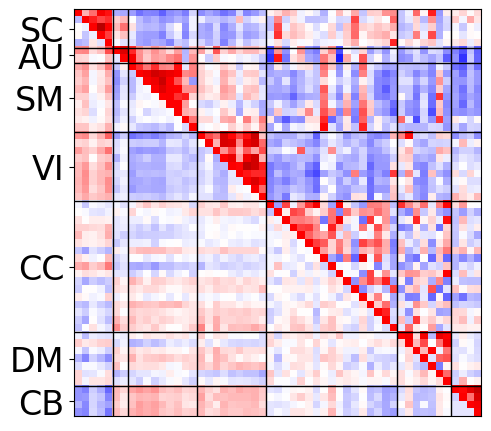

In [16]:
# SZ group average of original sFNC in the training set
fbirn_sfnc_data_mean_removed_pt = np.mean(sfnc_data_mean_removed_train[:len(ind_pt_train), :],axis=0) * 2
fbirn_sfnc_data_pt = np.mean(sfnc_data_raw_train[:len(ind_pt_train), :],axis=0)
fbirn_sfnc_data_pt[np.tril_indices(53, -1)] = fbirn_sfnc_data_mean_removed_pt[np.tril_indices(53, -1)]
fbirn_sfnc_data_pt[ np.diag_indices(53) ] = 0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_pt, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_pt_avg_train_final.png'), dpi=600)

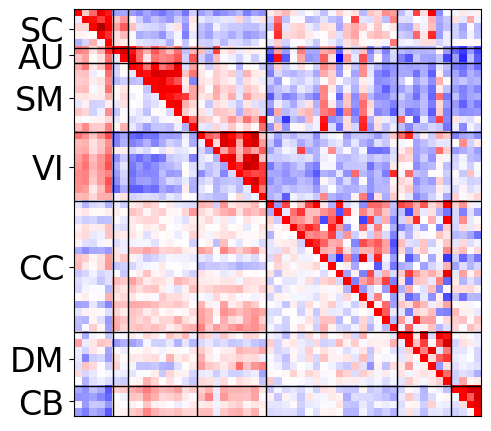

In [17]:
# SZ group average of original sFNC in the test set
fbirn_sfnc_data_mean_removed_pt = np.mean(sfnc_data_mean_removed_test[:len(ind_pt_test), :],axis=0) * 2
fbirn_sfnc_data_pt = np.copy(np.mean(sfnc_data_raw_test[:len(ind_pt_test), :],axis=0))
fbirn_sfnc_data_pt[np.tril_indices(53, -1)] = fbirn_sfnc_data_mean_removed_pt[np.tril_indices(53, -1)]
fbirn_sfnc_data_pt[ np.diag_indices(53) ] = 0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_pt, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_pt_avg_test_final.png'), dpi=600)

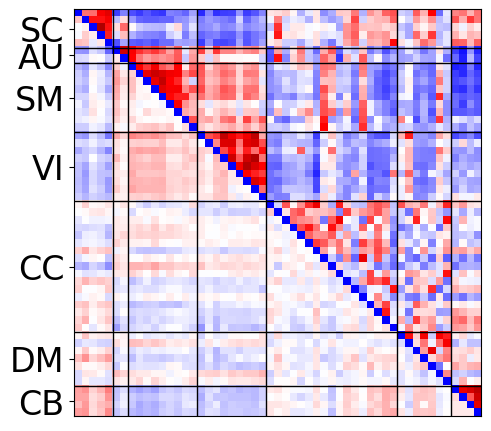

In [18]:
# CTR group average of original sFNC in the training set
fbirn_sfnc_data_mean_removed_hc = np.mean(sfnc_data_mean_removed_train[len(ind_pt_train):, :],axis=0) * 2
fbirn_sfnc_data_hc = np.copy(np.mean(sfnc_data_raw_train[len(ind_pt_train):, :],axis=0))
fbirn_sfnc_data_hc[np.tril_indices(53, -1)] = fbirn_sfnc_data_mean_removed_hc[np.tril_indices(53, -1)]
fbirn_sfnc_data_hc[np.diag_indices(53)] = -0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_hc, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_hc_avg_train_final.png'), dpi=600)

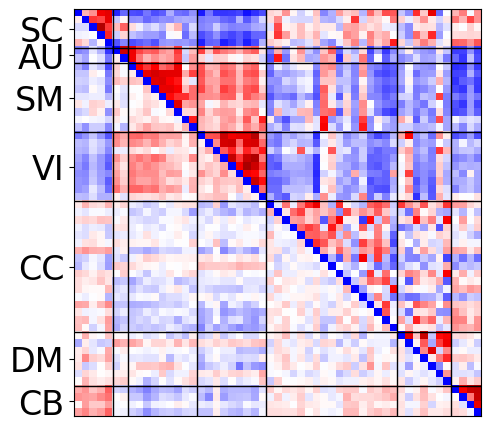

In [19]:
# CTR group average of original sFNC in the test set
fbirn_sfnc_data_mean_removed_hc = np.mean(sfnc_data_mean_removed_test[len(ind_pt_test):, :],axis=0) * 2
fbirn_sfnc_data_hc = np.copy(np.mean(fbirn_sfnc_data_raw[ind_hc_test, :],axis=0))
fbirn_sfnc_data_hc[np.tril_indices(53, -1)] = fbirn_sfnc_data_mean_removed_hc[np.tril_indices(53, -1)]
fbirn_sfnc_data_hc[ np.diag_indices(53) ] = -0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_hc, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_hc_avg_test_final.png'), dpi=600)

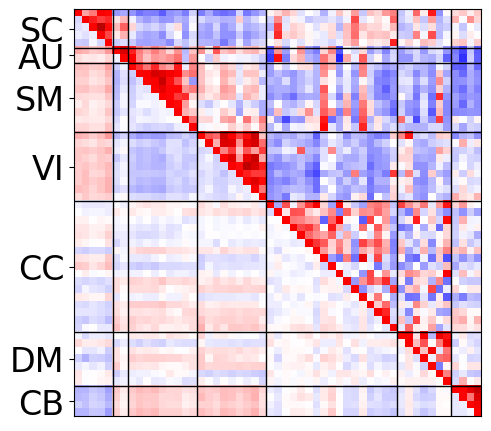

In [20]:
# SZ group average of generated sFNC in the training set
fbirn_sfnc_data_pt_mean_rm = np.mean(np.array(fnc_vae_mean_rm_pt_list),axis=0) * 2
fbirn_sfnc_data_pt = np.mean(np.array(fnc_vae_pt_list),axis=0)
fbirn_sfnc_data_pt[np.tril_indices(53, -1)] = fbirn_sfnc_data_pt_mean_rm[np.tril_indices(53, -1)]
fbirn_sfnc_data_pt[ np.diag_indices(53) ] = 0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_pt, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}_pt_avg_train_final.png'), dpi=600)

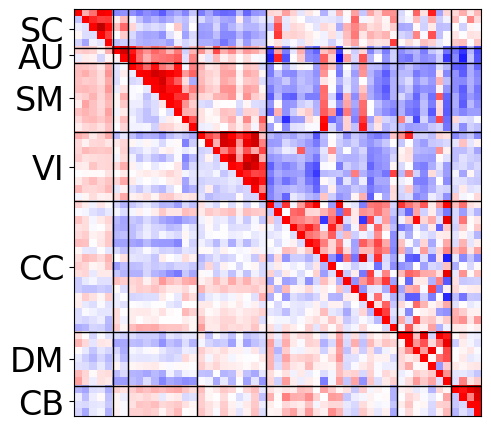

In [21]:
# SZ group average of generated sFNC in the test set
fbirn_sfnc_data_pt_mean_rm = np.mean(np.array(fnc_vae_mean_rm_pt_test_list),axis=0) * 2
fbirn_sfnc_data_pt = np.mean(np.array(fnc_vae_pt_test_list),axis=0)
fbirn_sfnc_data_pt[np.tril_indices(53, -1)] = fbirn_sfnc_data_pt_mean_rm[np.tril_indices(53, -1)]
fbirn_sfnc_data_pt[ np.diag_indices(53) ] = 0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_pt, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}_pt_avg_test_final.png'), dpi=600)

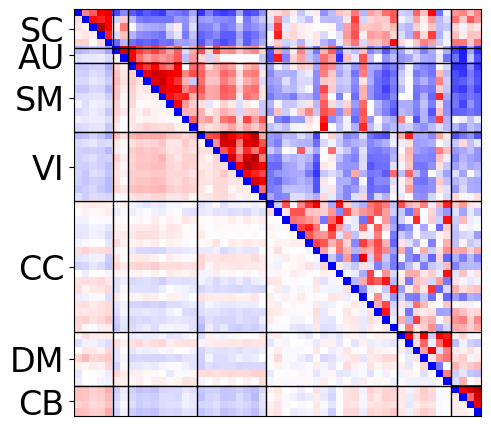

In [22]:
# CTR group average of generated sFNC in the training set
fbirn_sfnc_data_hc_mean_rm = np.mean(np.array(fnc_vae_mean_rm_hc_list),axis=0) * 2
fbirn_sfnc_data_hc = np.mean(np.array(fnc_vae_hc_list),axis=0)
fbirn_sfnc_data_hc[np.tril_indices(53, -1)] = fbirn_sfnc_data_hc_mean_rm[np.tril_indices(53, -1)]
fbirn_sfnc_data_hc[ np.diag_indices(53) ] = -0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_hc, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}_hc_avg_train_final.png'), dpi=600)

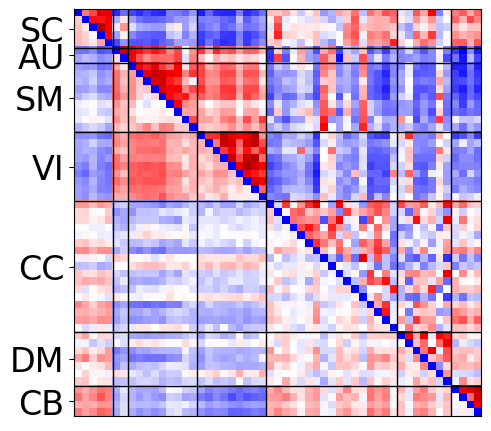

In [23]:
# CTR group average of generated sFNC in the test set
fbirn_sfnc_data_hc_mean_rm = np.mean(np.array(fnc_vae_mean_rm_hc_test_list),axis=0) * 2
fbirn_sfnc_data_hc = np.mean(np.array(fnc_vae_hc_test_list),axis=0)
fbirn_sfnc_data_hc[np.tril_indices(53, -1)] = fbirn_sfnc_data_hc_mean_rm[np.tril_indices(53, -1)]
fbirn_sfnc_data_hc[ np.diag_indices(53) ] = -0.5

plt.figure(figsize=(5, 5))
plt.xticks([])
plt.yticks(network_label_ind, network_list, fontsize=24)
plt.imshow(fbirn_sfnc_data_hc, cmap="seismic", vmin=-1, vmax=1)
for j in network_ind:
  plt.axhline(y=j, linewidth=1, color='k')
  plt.axvline(x=j, linewidth=1, color='k')

plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}_hc_avg_test_final.png'), dpi=600)

/tmp/ipykernel_2482178/3669261302.py:18: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


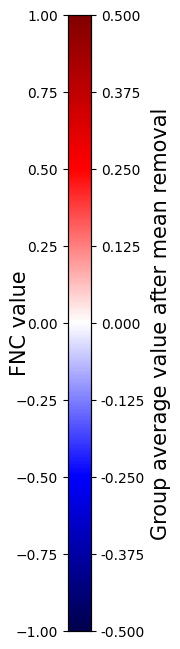

In [24]:
fig, ax = plt.subplots(figsize=(0.3,8))
cmap = mpl.cm.seismic
norm = mpl.colors.Normalize(vmin=-1, vmax=1)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

ax.set_ylabel("FNC value", fontsize=15)
ax.yaxis.tick_left()
ax.yaxis.label_position = 'left'

ax2 = ax.twinx()
ax2.set_yticks(list(np.linspace(-1, 1, 9)))
ax2.set_yticklabels([f"{i:.3f}" for i in list(np.round(np.linspace(-0.5, 0.5, 9), 3))])
ax2.set_ylabel("Group average value after mean removal", fontsize=15)
# ax2.set_ylabel("Group difference value", fontsize=15)

plt.tight_layout()
plt.savefig(os.path.join(res_path, 'double_colorbar_sfnc.png'), bbox_inches='tight', dpi=600)
# plt.savefig(os.path.join(res_path, 'double_colorbar_dfnc.png'), bbox_inches='tight', dpi=600)

225 106 0.795145223009028 0.06284057327146873 0.7936235104718636 [0.75513646 0.79362351 0.83505798] 0.9259069417489745 0.6209734640414628


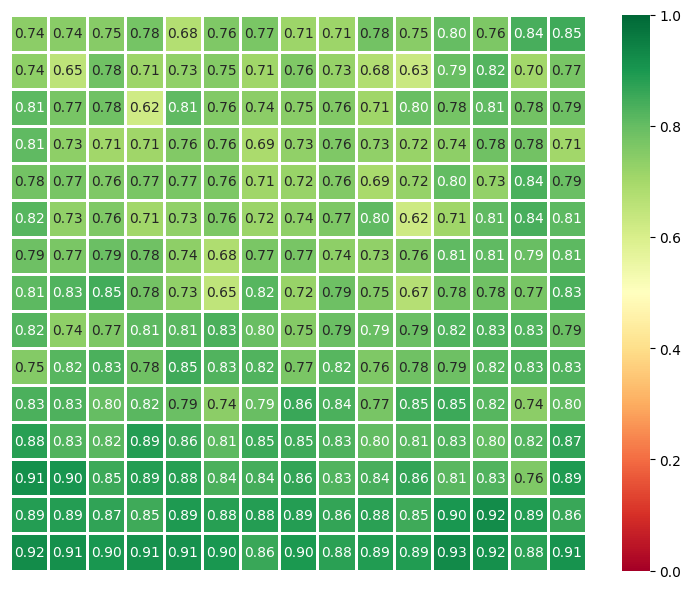

In [25]:
# calculate correlations between original FNC and generated FNC in the training set
orig = np.zeros((n_train_sq, n_train_sq, 1378))
vae = np.zeros((n_train_sq, n_train_sq, 1378))
corr = np.zeros((n_train_sq, n_train_sq))
p = np.zeros((n_train_sq, n_train_sq))

for i in range(n_train_sq):
  for j in range(n_train_sq):
    orig[i,j,:] = fnc_orig[i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size, j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size][np.triu_indices(53, 1)]
    vae[i,j,:] = fnc_vae[i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size, j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size][np.triu_indices(53, 1)]
    corr[i,j], p[i,j] = pearsonr(orig[i,j,:], vae[i,j,:])

np.save(os.path.join(res_path, 'corr.npy'), corr)
print(np.sum(corr>0.6), np.sum(corr>0.8), np.mean(corr), np.std(corr), np.median(corr), np.percentile(corr, [25, 50, 75]), np.max(corr), np.min(corr))

plt.figure(figsize=(7.5, 6))
sns.heatmap(np.abs(corr), linewidths=1, annot=True, fmt='.2f', cmap="RdYlGn", vmin=0, vmax=1, cbar_kws={"shrink": 1})
plt.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(res_path, 'corr_fnc.png'), dpi=500)

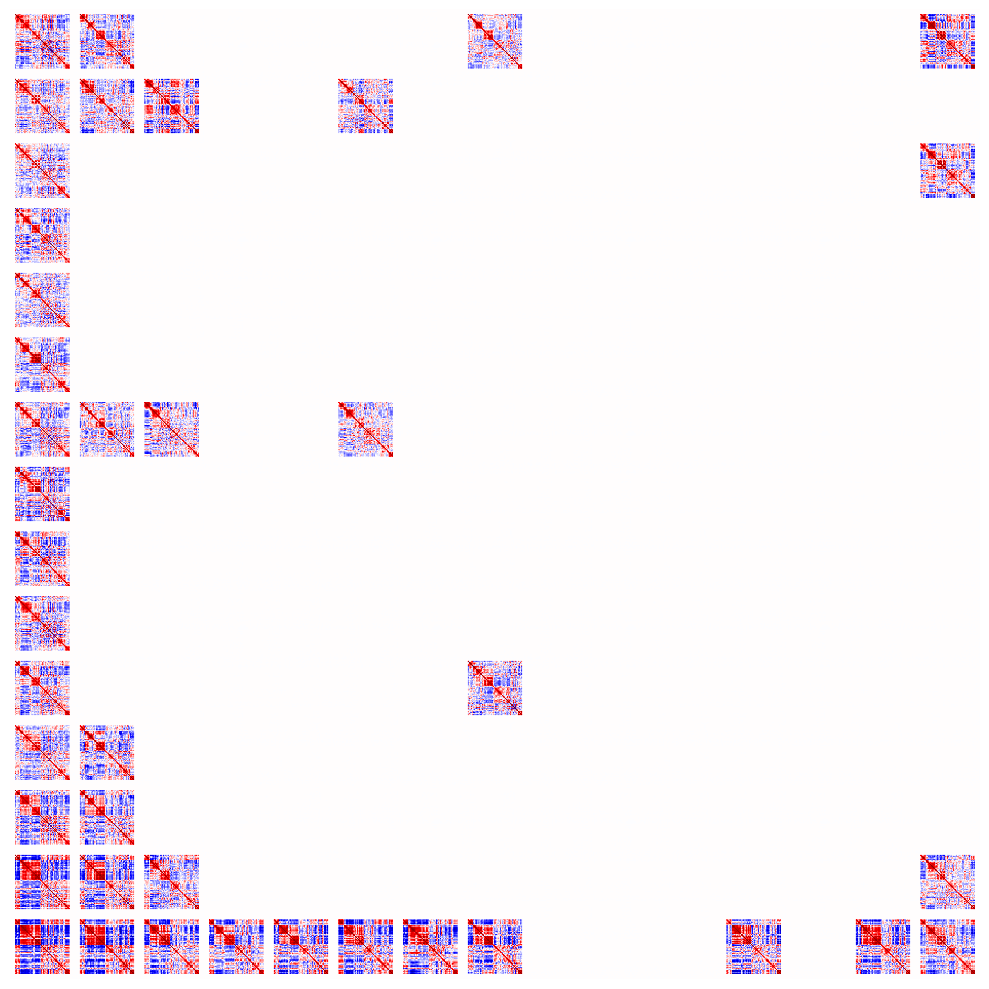

In [26]:
# display a 2D manifold of original sFNC in the test set
fnc_orig_test = np.zeros(((matrix_size+space)*n_train_sq, (matrix_size+space)*n_train_sq))
for sub in range(grid_jv_int_test.shape[0]):
    i = (n_train_sq-1) - round(grid_jv_int_test[sub, 1])
    j = round(grid_jv_int_test[sub, 0])
    fnc_orig_test[
        i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+53,
        j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+53,
    ] = sfnc_data_raw_test[sub]
np.save(os.path.join(res_path, 'fnc_orig_test.npy'), fnc_orig_test)

plt.figure(figsize=(figsize, figsize))
colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_orig_test, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_test.png'), dpi=500)

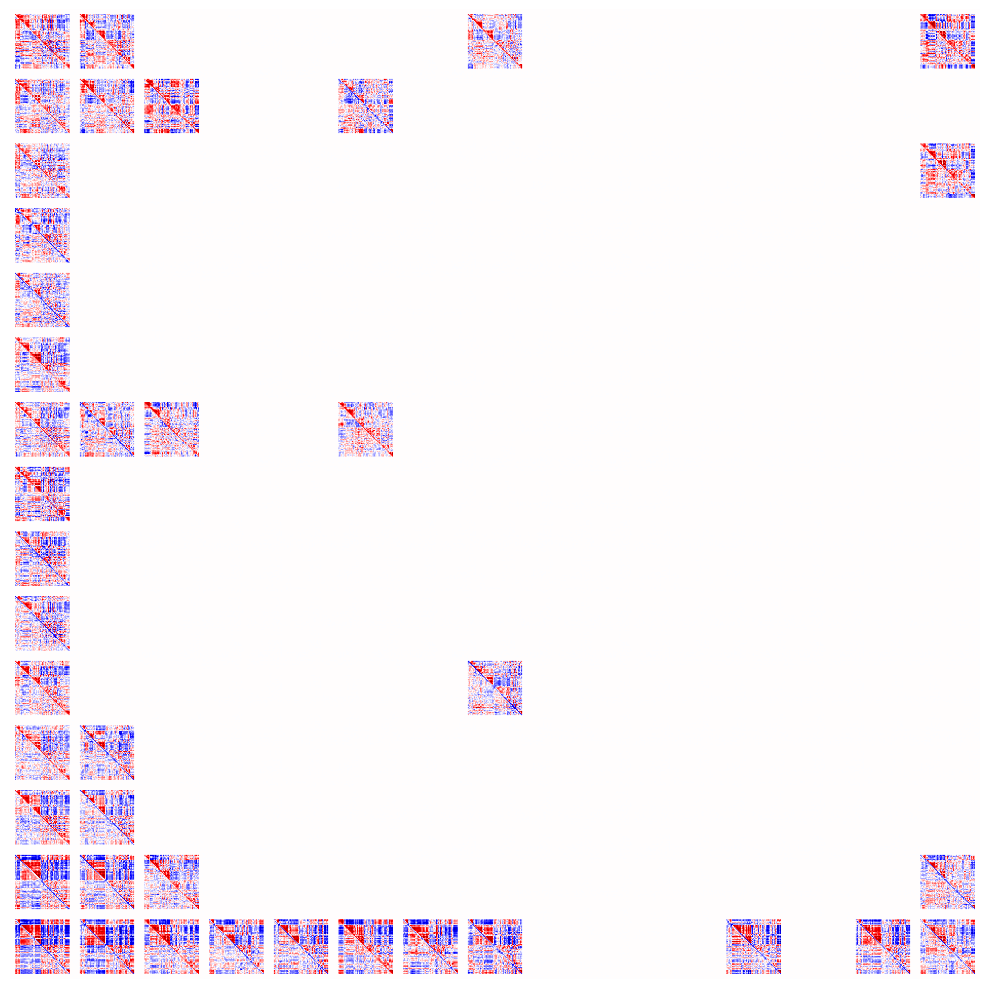

In [27]:
# display a 2D manifold of original sFNC with mean removed in the test set
fnc_orig_mean_rm_test = np.zeros(( (matrix_size+space) * n_train_sq, (matrix_size+space) * n_train_sq))
for sub in range(grid_jv_int_test.shape[0]):
  sfnc = copy.copy(sfnc_data_raw_test[sub])
  sfnc_mean_removed = copy.copy(sfnc_data_mean_removed_test[sub])
  if (y_test[sub,0] == 1):
    sfnc[np.diag_indices(53)] = 0.5
  else:
    sfnc[np.diag_indices(53)] = -0.5
  sfnc[np.tril_indices(53, -1)] = sfnc_mean_removed[np.tril_indices(53, -1)]
  i = (n_train_sq-1) - round(grid_jv_int_test[sub, 1])
  j = round(grid_jv_int_test[sub, 0])
  fnc_orig_mean_rm_test[
      i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size,
      j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size,
  ] = sfnc
np.save(os.path.join(res_path, 'fnc_orig_mean_rm_test.npy'), fnc_orig_mean_rm_test)

plt.figure(figsize=(figsize, figsize))
colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_orig_mean_rm_test, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, 'fnc_orig_diag_mean_removed_test.png'), dpi=500)

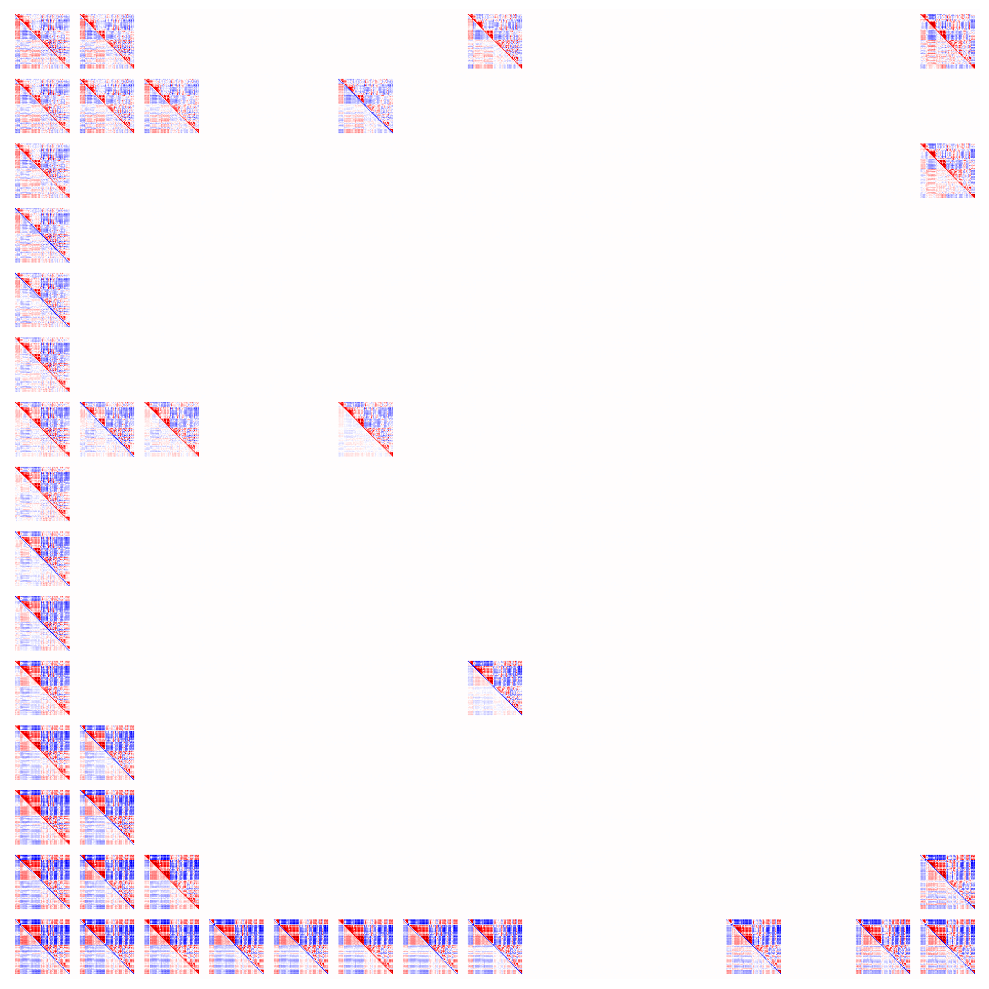

In [28]:
# display a 2D manifold of generated sFNC with mean removed in the test set
fnc_vae_list = []
fnc_vae_mean_removed = copy.copy(fnc_vae)
fnc_vae_mean_rm = np.zeros(fnc_vae_mean_removed.shape)

for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        fnc_vae_list.append(fnc_vae[
            i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+53,
            j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+53,
        ])

fnc_vae_mean = np.mean(np.array(fnc_vae_list), axis=0)
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        if y_test_2d[i, j] == 0:
            continue
        sfnc = copy.copy(fnc_vae_mean_removed[
            i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+53,
            j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+53,
        ])
        sfnc[np.tril_indices(53, -1)] = sfnc[np.tril_indices(53, -1)] - fnc_vae_mean[np.tril_indices(53, -1)]
        if y_test_2d[i, j] == 1:
          sfnc[ np.diag_indices(53) ] = 0.5
        else:
          sfnc[ np.diag_indices(53) ] = -0.5

        fnc_vae_mean_rm[
            i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+53,
            j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+53,
        ] = sfnc
np.save(os.path.join(res_path, f'fnc_{method}_mean_rm_test.npy'), fnc_vae_mean_rm)

plt.figure(figsize=(figsize, figsize))

colorbar_scale = 1
plt.axis('off')
plt.imshow(fnc_vae_mean_rm, cmap="seismic", vmin=-colorbar_scale, vmax=colorbar_scale)
plt.tight_layout()
plt.savefig(os.path.join(res_path, f'fnc_{method}_diag_mean_removed_test.png'), dpi=500)

/tmp/ipykernel_2482178/1220160336.py:11: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr[i,j], p[i,j] = pearsonr(orig[i,j,:], vae[i,j,:])


41 15 0.7686871653752229 0.07784228847417443 0.7551748571174701 [0.71843319 0.75517486 0.83544827] 0.8984400658167154 0.6044429531633091


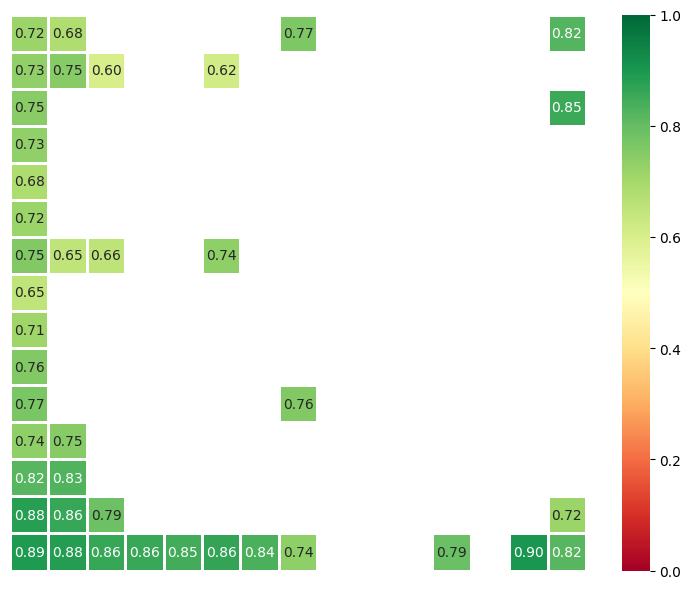

In [29]:
# calculate correlations between original FNC and generated FNC in the test set
orig = np.zeros((n_train_sq, n_train_sq, 1378))
vae = np.zeros((n_train_sq, n_train_sq, 1378))
corr = np.zeros((n_train_sq, n_train_sq))
p = np.zeros((n_train_sq, n_train_sq))

for i in range(n_train_sq):
  for j in range(n_train_sq):
    orig[i,j,:] = fnc_orig_test[i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size, j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size][np.triu_indices(matrix_size, 1)]
    vae[i,j,:] = fnc_vae[i * (matrix_size+space)+space//2 : i * (matrix_size+space)+space//2+matrix_size, j * (matrix_size+space)+space//2 : j * (matrix_size+space)+space//2+matrix_size][np.triu_indices(matrix_size, 1)]
    corr[i,j], p[i,j] = pearsonr(orig[i,j,:], vae[i,j,:])

corr_valid = corr[~np.isnan(corr)]

np.save(os.path.join(res_path, 'corr_test.npy'), corr)
print(np.sum(corr_valid>0.6), np.sum(corr_valid>0.8), np.mean(corr_valid), np.std(corr_valid), np.median(corr_valid), np.percentile(corr_valid, [25, 50, 75]), np.max(corr_valid), np.min(corr_valid))

plt.figure(figsize=(7.5, 6))
sns.heatmap(np.abs(corr), linewidths=1, annot=True, fmt='.2f', cmap="RdYlGn", vmin=0, vmax=1, cbar_kws={"shrink": 1}) #PiYG
plt.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(res_path, 'corr_fnc_test.png'), dpi=500)